In [30]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import plotly_express as px
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import os
import time
from selenium import webdriver
pd.options.mode.chained_assignment = None

In [31]:
def save_folium_map(m, save_path):
    import time
    
    delay=2
    fn='temp_map.html'
    tmpurl='file://{path}/{mapfile}'.format(path=os.getcwd(),mapfile=fn)
    m.save(fn)

    browser = webdriver.Firefox()
    browser.get(tmpurl)
    browser.set_window_size(1920, 1432)
    time.sleep(delay)
    browser.save_screenshot(save_path)
    browser.quit()

## Stations

In [32]:
stations_df = pd.read_csv("../data/raw/Helsingin_ja_Espoon_kaupunkipyöräasemat_avoin_7704606743268189464.csv")
stations_df["geometry"] = [Point(xy) for xy in zip(stations_df.x, stations_df.y)]
station_coords_dict = stations_df.set_index("ID")["geometry"].to_dict()

In [33]:
stations_df

,FID,ID,Nimi,Namn,Name,Osoite,Adress,Kaupunki,Stad,Operaattor,Kapasiteet,x,y,x2,y2,geometry
0,1,501,Hanasaari,Hanaholmen,Hanasaari,Hanasaarenranta 1,Hanaholmsstranden 1,Espoo,Esbo,CityBike Finland,10,24.840319,60.165820,2.549113e+07,6.672558e+06,POINT (24.840319 60.16582)
1,2,503,Keilalahti,Kägelviken,Keilalahti,Keilalahdentie 2,Kägelviksvägen 2,Espoo,Esbo,CityBike Finland,28,24.827467,60.171524,2.549042e+07,6.673195e+06,POINT (24.827467 60.171524)
2,3,505,Westendinasema,Westendstationen,Westendinasema,Westendintie 1,Westendvägen 1,Espoo,Esbo,CityBike Finland,16,24.805758,60.168266,2.548922e+07,6.672836e+06,POINT (24.805758 60.168266)
3,4,507,Golfpolku,Golfstigen,Golfpolku,Golfpolku 3,Golfstigen 3,Espoo,Esbo,CityBike Finland,16,24.796136,60.168143,2.548868e+07,6.672824e+06,POINT (24.796136 60.168143)
4,5,509,Revontulentie,Norrskensvägen,Revontulentie,Revontulentie 10,Norrskensvägen 10,Espoo,Esbo,CityBike Finland,30,24.802938,60.171551,2.548906e+07,6.673202e+06,POINT (24.802938 60.171551)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,453,401,Koivusaari (M),Björkholmens metrostation,Koivusaari metro station,Sotkatie 11,Dykandsvägen 11,,,,16,24.855164,60.163386,2.549196e+07,6.672285e+06,POINT (24.8551642686834 60.1633863116225)
453,454,402,Bermudankuja,Bermudagränden,Välimerenkatu,Atlantinkatu 10,Atlantgatan 10,,,,16,24.910142,60.154904,2.549501e+07,6.671335e+06,POINT (24.9101421129463 60.1549042600429)
454,455,403,Verkkosaari,Nätholmen,Verkkosaari,Tukkutorinkuja 3,Partitorgsgränden,,,,20,24.977548,60.189556,2.549875e+07,6.675192e+06,POINT (24.9775480765957 60.1895561753156)
455,456,404,Sompasaari,Sumparn,Sompasaari,Sompasaarenlaituri 2,Sumparkajen 2,,,,14,24.976076,60.182931,2.549867e+07,6.674454e+06,POINT (24.9760758238593 60.1829308185667)


In [34]:
gpd.GeoDataFrame(stations_df, geometry="geometry", crs="EPSG:4326").explore(tiles="cartodb positron", marker_kwds={"radius":4})

## Departure heatmaps

In [35]:
data = pd.read_csv("../data/processed/grouped_counts.csv")[["Departure station id", "time", "count"]]
data = data.groupby(["Departure station id", "time"])["count"].sum().reset_index()
data["coords"] = data["Departure station id"].map(station_coords_dict)
data = data.dropna()

data["lon"] = data["coords"].apply(lambda point: point.coords[0][0])
data["lat"] = data["coords"].apply(lambda point: point.coords[0][1])

departures_df = data.copy()

data

,Departure station id,time,count,coords,lon,lat
0,1,00:00:00,266,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
1,1,01:00:00,137,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
2,1,02:00:00,88,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
3,1,03:00:00,57,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
4,1,04:00:00,35,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
...,...,...,...,...,...,...
10854,902,19:00:00,24,POINT (24.835356 60.209017),24.835356,60.209017
10855,902,20:00:00,13,POINT (24.835356 60.209017),24.835356,60.209017
10856,902,21:00:00,10,POINT (24.835356 60.209017),24.835356,60.209017
10857,902,22:00:00,11,POINT (24.835356 60.209017),24.835356,60.209017


In [36]:
data2 = data[data["time"]=="03:00:00"]

gdf = gpd.GeoDataFrame(data2, geometry="coords", crs="EPSG:4326")
gdf["count"] = np.log2(gdf["count"] + 1)

gdf.explore(column="count", tiles="Cartodb dark_matter", cmap="Reds", marker_kwds={"radius": 10})

In [37]:
# for time in sorted(data["time"].unique()):
#     data2 = data[data["time"]==time]

#     gdf = gpd.GeoDataFrame(data2, geometry="coords", crs="EPSG:4326")
#     gdf["count"] = np.log2(gdf["count"] + 1)

#     # gdf.explore(column="count", tiles="Cartodb dark_matter", cmap="Blues_r")
#     ax = gdf.plot(column="count", vmax=10, cmap="Reds")
#     ax.set_xlim([data["lon"].min(), data["lon"].max()])
#     ax.set_ylim([data["lat"].min(), data["lat"].max()])
#     ax.set_title(time)
#     ax
#     plt.savefig(f"../results/heatmap_timelapse/{time[:2]}.png")

Heatmap plotting

In [38]:
# for time in sorted(data["time"].unique()):
#     df = data[data["time"]==time]
#     df["count"] = np.log2(df["count"])
#     gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
#     fig = px.density_mapbox(gdf, lat="lat", lon="lon", z="count", radius=18, center=dict(lat=data.lat.mean(), lon=data.lon.mean()), zoom=10, mapbox_style="carto-positron", height=1000, title=time, 
#     range_color=[0,12.5]
#     )
#     fig.write_image(f"../results/px_heatmap_timelapse/{time[:2]}.png", width=800, height=600, scale=2) 

## Return heatmaps

In [39]:
data = pd.read_csv("../data/processed/grouped_counts.csv")[["Return station id", "time", "count"]]
data = data.groupby(["Return station id", "time"])["count"].sum().reset_index()
data["coords"] = data["Return station id"].map(station_coords_dict)
data = data.dropna()

data["lon"] = data["coords"].apply(lambda point: point.coords[0][0])
data["lat"] = data["coords"].apply(lambda point: point.coords[0][1])

return_df = data.copy()

data

,Return station id,time,count,coords,lon,lat
0,1,00:00:00,165,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
1,1,01:00:00,94,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
2,1,02:00:00,62,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
3,1,03:00:00,41,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
4,1,04:00:00,29,POINT (24.9502114714031 60.155369615074),24.950211,60.155370
...,...,...,...,...,...,...
10851,902,19:00:00,9,POINT (24.835356 60.209017),24.835356,60.209017
10852,902,20:00:00,13,POINT (24.835356 60.209017),24.835356,60.209017
10853,902,21:00:00,7,POINT (24.835356 60.209017),24.835356,60.209017
10854,902,22:00:00,5,POINT (24.835356 60.209017),24.835356,60.209017


In [40]:
df = return_df.groupby("Return station id")["count"].sum().reset_index()
df = pd.merge(df, return_df[["Return station id", "coords"]], how="left")
df["count"] = np.log2(df["count"] + 1)

gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326").explore(column="count", tiles="cartodb positron", marker_kwds={"radius": 10}, style_kwds={"fillOpacity":0.2})

Heatmap plotting

In [41]:
# for time in sorted(data["time"].unique()):
#     df = data[data["time"]==time]
#     df["count"] = np.log2(df["count"])
#     gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
#     fig = px.density_mapbox(gdf, lat="lat", lon="lon", z="count", radius=18, center=dict(lat=data.lat.mean(), lon=data.lon.mean()), zoom=10, mapbox_style="carto-positron", height=1000, title=time, 
#     range_color=[0,12.5]
#     )
#     fig.write_image(f"../results/px_heatmap_timelapse_r/{time[:2]}.png", width=800, height=600, scale=2) 

## Net flow

In [42]:
departures_df = departures_df.rename(columns={"count": "departures"})
return_df = return_df.rename(columns={"count": "returns"})

In [43]:
net_flow_df = departures_df.merge(return_df[["Return station id", "time", "returns"]], left_on=["Departure station id", "time"], right_on=["Return station id", "time"]).drop(columns=["Return station id"])
net_flow_df

,Departure station id,time,departures,coords,lon,lat,returns
0,1,00:00:00,266,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,165
1,1,01:00:00,137,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,94
2,1,02:00:00,88,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,62
3,1,03:00:00,57,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,41
4,1,04:00:00,35,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,29
...,...,...,...,...,...,...,...
10737,902,19:00:00,24,POINT (24.835356 60.209017),24.835356,60.209017,9
10738,902,20:00:00,13,POINT (24.835356 60.209017),24.835356,60.209017,13
10739,902,21:00:00,10,POINT (24.835356 60.209017),24.835356,60.209017,7
10740,902,22:00:00,11,POINT (24.835356 60.209017),24.835356,60.209017,5


In [44]:
net_flow_df["net_flow"] = net_flow_df["returns"] - net_flow_df["departures"]
net_flow_df["sign"] = net_flow_df["net_flow"]
net_flow_df["net_flow"] = np.log2(np.abs(net_flow_df["net_flow"]) + 0.99)
net_flow_df["net_flow"] = np.copysign(net_flow_df["net_flow"], net_flow_df["sign"])
net_flow_df["volume"] = net_flow_df["departures"] + net_flow_df["returns"]
net_flow_df

,Departure station id,time,departures,coords,lon,lat,returns,net_flow,sign,volume
0,1,00:00:00,266,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,165,-6.672284,-101,431
1,1,01:00:00,137,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,94,-5.459104,-43,231
2,1,02:00:00,88,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,62,-4.754353,-26,150
3,1,03:00:00,57,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,41,-4.086614,-16,98
4,1,04:00:00,35,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,29,-2.805292,-6,64
...,...,...,...,...,...,...,...,...,...,...
10737,902,19:00:00,24,POINT (24.835356 60.209017),24.835356,60.209017,9,-3.999098,-15,33
10738,902,20:00:00,13,POINT (24.835356 60.209017),24.835356,60.209017,13,0.014500,0,26
10739,902,21:00:00,10,POINT (24.835356 60.209017),24.835356,60.209017,7,-1.996389,-3,17
10740,902,22:00:00,11,POINT (24.835356 60.209017),24.835356,60.209017,5,-2.805292,-6,16


<Axes: >

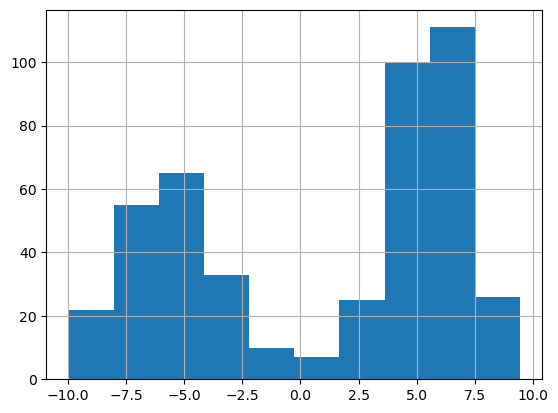

In [45]:
time = sorted(data["time"].unique())[18]
df = net_flow_df[net_flow_df["time"]==time]
df["net_flow"].hist()

In [46]:
net_flow_df["net_flow"].describe()

count    10742.000000
mean         0.012764
std          5.361085
min        -11.387473
25%         -5.087038
50%          0.014500
75%          5.043957
max         11.356446
Name: net_flow, dtype: float64

In [47]:
df = net_flow_df[net_flow_df["time"]=="09:00:00"]
df = df[df["net_flow"]>0]
df["net_flow"] = np.abs(df["net_flow"])

gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
fig = px.density_mapbox(gdf, lat="lat", lon="lon", z="net_flow", radius=70, center=dict(lat=data.lat.mean(), lon=data.lon.mean()), zoom=11, mapbox_style="carto-positron", height=1000, title=f"Inflows at {time}", 
# color_continuous_midpoint=0,
# color_continuous_scale=["blue", "lightblue"],
range_color=[0,10],
)
# fig

In [48]:
# for time in sorted(data["time"].unique()):
#     df = net_flow_df[net_flow_df["time"]==time]
    
#     gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
#     fig = px.density_mapbox(gdf, lat="lat", lon="lon", z="net_flow", radius=18, center=dict(lat=data.lat.mean(), lon=data.lon.mean()), zoom=10, mapbox_style="carto-positron", height=1000, title=f"Net flows at {time}", 
#     # color_continuous_scale=["white", "red"],
#     # color_continuous_scale=["blue", "lightblue"],
#     range_color=[-1,1],
#     )
#     fig.write_image(f"../results/net_flow_timelapse/total/{time[:2]}.png", width=800, height=600, scale=2) 

In [49]:
# for time in sorted(data["time"].unique()):
#     df = net_flow_df[net_flow_df["time"]==time]

#     gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")

#     ax = gdf.plot(column="net_flow",vmin=-10, vmax=10, figsize=(10,10), markersize=80, cmap="RdBu_r")
#     ax.set_xlim([net_flow_df["lon"].min()-0.01, net_flow_df["lon"].max()+0.01])
#     ax.set_ylim([net_flow_df["lat"].min()-0.01, net_flow_df["lat"].max()+0.01])

#     sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=plt.Normalize(vmin=-10, vmax=10))
#     plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
#     ax.set_title(time)
#     ax
#     plt.savefig(f"../results/net_flow_timelapse/dots/{time[:2]}.png")

In [50]:
# df = net_flow_df[net_flow_df["time"]=="08:00:00"]

# fig = px.scatter_map(df, lat="lat", lon="lon", color="net_flow", center=dict(lat=data.lat.mean()+0.007, lon=data.lon.mean()), zoom=11, map_style="carto-positron", height=1100, title=f"Net flows at {time}")
# fig.update_traces(marker=dict(size=16, opacity=0.5))
# fig.show()

In [51]:
df = net_flow_df[net_flow_df["time"]=="08:00:00"]
gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
m = gdf.explore(column="net_flow", tiles="CartoDB positron", marker_kwds={"radius":10}, zoom_start=12)
m

### Save maps

In [52]:
# import time

# lat = net_flow_df["lat"].mean()
# lon = net_flow_df["lon"].mean()

# for t in sorted(net_flow_df["time"].unique()):
#     df = net_flow_df[net_flow_df["time"]==t]
#     gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
#     m = folium.Map(location=[lat, lon], zoom_start=12, tiles="CartoDB positron",)
#     gdf.explore(m=m, column="net_flow",  marker_kwds={"radius":10})

#     delay=2
#     fn='map.html'
#     tmpurl='file://{path}/{mapfile}'.format(path=os.getcwd(),mapfile=fn)
#     m.save(fn)

#     browser = webdriver.Firefox()
#     browser.set_window_size(1920*1.05, 1432)
#     browser.get(tmpurl)
#     time.sleep(delay)
#     browser.save_screenshot(f"../results/net_flow_timelapse/dots/{t[:2]}.png")
#     browser.quit()

### Graphs

<Axes: xlabel='time'>

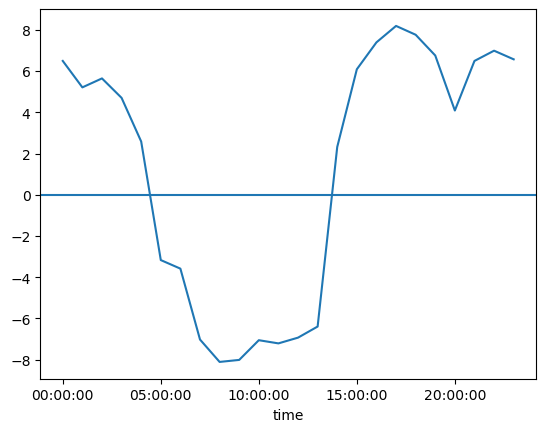

In [53]:
ax = net_flow_df[net_flow_df["Departure station id"]==100].set_index("time")["net_flow"].plot()
ax.axhline(0)
ax

## Yöelämä

In [54]:
night_life = net_flow_df[net_flow_df["time"].isin(["23:00:00", "00:00:00", "01:00:00", "02:00:00", "03:00:00", "04:00:00"])]
night_life = night_life.groupby("Departure station id").agg({"departures":"sum", "returns":"sum", "coords":"first"}).reset_index()

night_life["net_flow"] = night_life["returns"] - night_life["departures"]
night_life["sign"] = night_life["net_flow"]
night_life["net_flow"] = np.log2(np.abs(night_life["net_flow"]) + 1)
night_life["net_flow"] = np.copysign(night_life["net_flow"], night_life["sign"])
night_life

,Departure station id,departures,returns,coords,net_flow,sign
0,1,1044,654,POINT (24.9502114714031 60.155369615074),-8.611025,-390
1,2,481,441,POINT (24.9565097715858 60.1609890692806),-5.357552,-40
2,3,836,1033,POINT (24.9450181631667 60.1581769029949),7.629357,197
3,4,865,984,POINT (24.9417758006418 60.1609858921764),6.906891,119
4,5,746,1095,POINT (24.9362853002102 60.157948291819),8.451211,349
...,...,...,...,...,...,...
449,761,200,48,POINT (24.83939 60.220467),-7.257388,-152
450,763,136,151,POINT (24.833536 60.220551),4.000000,15
451,767,24,60,POINT (24.820635 60.223377),5.209453,36
452,900,177,14,POINT (24.771826 60.180118),-7.357552,-163


In [55]:
from branca.colormap import LinearColormap

main_color = (254,138,24,255)
mid_color = tuple(x/2 for x in main_color)

# colors = [(255,255,255,0), (255,0,0,255)] # white to red
colors = [(16,1,102*2,0), (255,255,255,255)] # white to blue


# colors = [(255,255,255,0), (128,0,0,128), (255,0,0,255)]
# colors = [(255,255,255,0), mid_color, main_color]

custom_cmap = LinearColormap(colors, vmin=7, vmax=10.5)

In [56]:
lon_center = stations_df["x"].mean()
lat_center = stations_df["y"].mean()

In [57]:
df = night_life[night_life["net_flow"]<-8]
df["net_flow"] = np.abs(df["net_flow"])

gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")

m = folium.Map(location=[lat_center+0.015, lon_center-0.1], zoom_start=12, tiles="CartoDB dark-matter")
m = gdf.explore(m=m, column="net_flow", marker_kwds={"radius":10}, cmap="Reds_r", 
vmin=7, vmax=10.7
)

m

In [58]:
# save_folium_map(m=m, save_path="../presentation/night_life.png")

## Clustering

In [178]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [179]:
def optimise_k_means(data, max_k):
    means = []
    inertias = []

    for k in range(1, max_k):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)

        means.append(k)
        inertias.append(kmeans.inertia_)
    
    fig = plt.subplots(figsize=(10, 5))
    plt.plot(means, inertias, "o-")
    plt.xlabel("Number of clusters")
    plt.ylabel("Inertia")
    plt.grid(True)
    plt.show()

In [180]:
df = net_flow_df.pivot(columns="time", index="Departure station id", values="net_flow")
df.fillna(0, inplace=True)
df

time,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,09:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
Departure station id,,,,,,,,,,,,,,,,,,,,,
1,-6.672284,-5.459104,-4.754353,-4.086614,-2.805292,1.996389,-0.992768,3.458119,3.320485,-7.820115,...,7.650980,7.813717,7.247833,8.357508,6.988571,5.930501,-7.483735,-8.033368,-8.247880,-7.636552
2,-1.580145,3.168321,1.580145,-3.905928,-0.992768,-1.996389,4.247168,3.168321,8.179859,7.539081,...,6.087251,-4.754353,-7.348640,-6.882521,-6.475571,4.953731,2.805292,-4.857483,-4.699885,-5.087038
3,6.044176,5.906650,6.339672,2.319040,-3.999098,-4.391630,-7.409306,-8.044339,-8.686466,-8.491813,...,4.857483,7.366235,7.199574,7.569780,6.942397,-5.357200,7.839141,7.924753,7.584887,2.319040
4,5.043957,5.672142,5.087038,-1.996389,3.806324,-5.321567,-7.179810,-8.033368,-8.679445,-8.164857,...,5.425929,6.629211,6.569704,7.400794,7.139449,4.953731,6.714108,7.330827,6.442778,-2.805292
5,6.285217,5.043957,5.459104,5.614415,4.999549,-0.992768,-4.169123,-6.409221,-7.876456,-8.312838,...,4.643279,7.097927,7.768118,-4.906410,-2.805292,-4.522935,2.805292,6.442778,6.832763,6.894697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
761,-5.285032,-5.128871,-4.458776,-4.391630,-4.086614,-2.805292,0.014500,-3.320485,-4.522935,-2.805292,...,-3.999098,-0.992768,3.458119,-2.805292,-2.998196,-3.458119,-3.320485,-5.043957,-5.391974,-4.584361
763,0.014500,-1.996389,2.582556,-2.582556,1.996389,-0.992768,-5.832637,-6.857857,-7.761485,-6.643712,...,-4.857483,5.554282,6.894697,6.741332,-5.700162,5.754620,6.303598,6.149544,4.169123,3.999098
767,3.806324,2.582556,0.000000,0.992768,0.000000,0.000000,-2.582556,-5.459104,-6.459268,-6.768052,...,-4.391630,-2.998196,-3.999098,5.700162,-2.998196,-4.458776,2.582556,5.425929,4.754353,4.169123


array([[<Axes: title={'center': '00:00:00'}>,
        <Axes: title={'center': '01:00:00'}>,
        <Axes: title={'center': '02:00:00'}>,
        <Axes: title={'center': '03:00:00'}>,
        <Axes: title={'center': '04:00:00'}>],
       [<Axes: title={'center': '05:00:00'}>,
        <Axes: title={'center': '06:00:00'}>,
        <Axes: title={'center': '07:00:00'}>,
        <Axes: title={'center': '08:00:00'}>,
        <Axes: title={'center': '09:00:00'}>],
       [<Axes: title={'center': '10:00:00'}>,
        <Axes: title={'center': '11:00:00'}>,
        <Axes: title={'center': '12:00:00'}>,
        <Axes: title={'center': '13:00:00'}>,
        <Axes: title={'center': '14:00:00'}>],
       [<Axes: title={'center': '15:00:00'}>,
        <Axes: title={'center': '16:00:00'}>,
        <Axes: title={'center': '17:00:00'}>,
        <Axes: title={'center': '18:00:00'}>,
        <Axes: title={'center': '19:00:00'}>],
       [<Axes: title={'center': '20:00:00'}>,
        <Axes: title={'center'

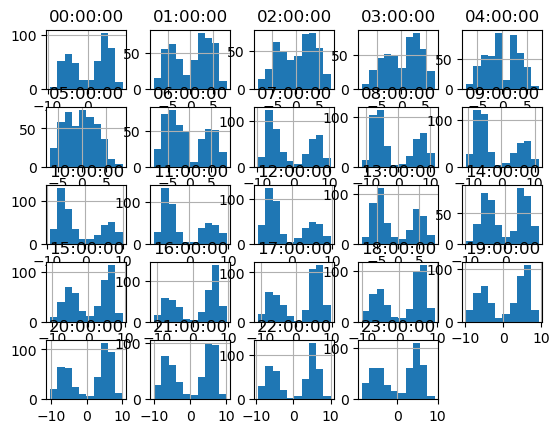

In [181]:
df.hist()

In [182]:
scaler = StandardScaler()
df.iloc[:,:] = scaler.fit_transform(df)
df

time,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,09:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
Departure station id,,,,,,,,,,,,,,,,,,,,,
1,-1.531776,-1.387250,-1.330494,-1.272447,-0.919805,0.725475,-0.095110,0.730612,0.669123,-0.968405,...,1.528567,1.322016,0.980358,1.167970,1.048959,0.918862,-1.434772,-1.456349,-1.572480,-1.633489
2,-0.451836,0.681994,0.327016,-1.221078,-0.355874,-0.522694,1.040484,0.682032,1.383271,1.466688,...,1.209552,-1.018145,-1.412660,-1.356727,-1.299479,0.743450,0.317003,-0.922135,-0.942209,-1.127727
3,1.165129,1.338769,1.572413,0.548653,-1.291234,-1.271462,-1.485696,-1.197596,-1.095452,-1.074898,...,0.958668,1.238695,0.972446,1.037473,1.040906,-1.108225,1.174049,1.227956,1.240072,0.341458
4,0.953003,1.282523,1.244644,-0.678204,1.137267,-1.562166,-1.435959,-1.195757,-1.094420,-1.023061,...,1.074636,1.101462,0.869182,1.009479,1.075276,0.743450,0.982505,1.128052,1.037187,-0.675085
5,1.216249,1.131856,1.342000,1.485515,1.508515,-0.208955,-0.783486,-0.923494,-0.976410,-1.046523,...,0.914969,1.188736,1.065656,-1.029360,-0.659302,-0.958405,0.317003,0.978674,1.106464,1.249156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
761,-1.237567,-1.308045,-1.253152,-1.359161,-1.318462,-0.775562,0.123184,-0.405716,-0.483568,-0.173340,...,-0.848157,-0.317742,0.359054,-0.681284,-0.692949,-0.767181,-0.725951,-0.953502,-1.065153,-1.028009
763,-0.113643,-0.556735,0.589311,-0.844849,0.574142,-0.208955,-1.144001,-0.998701,-0.959514,-0.781894,...,-1.023275,0.901311,0.922463,0.900231,-1.164230,0.887277,0.912613,0.929350,0.633292,0.674740
767,0.690526,0.541502,-0.086451,0.171600,-0.046994,0.101391,-0.439647,-0.764222,-0.768136,-0.801608,...,-0.928237,-0.691151,-0.863520,0.727748,-0.692949,-0.946883,0.279080,0.807631,0.737253,0.708469


In [183]:
# df.iloc[2].plot()

In [184]:
# optimize_k_means(df, 10)

In [185]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(df)

c:\Users\pyryp\anaconda3\envs\ox\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



KMeans(n_clusters=2)

In [186]:
df["group"] = kmeans.labels_
df = pd.DataFrame({"Departure station id":df.index, "group":df.group.tolist()})
df

,Departure station id,group
0,1,1
1,2,1
2,3,0
3,4,0
4,5,0
...,...,...
449,761,1
450,763,0
451,767,0
452,900,1


#### Map

In [187]:
df["coords"] = df["Departure station id"].map(station_coords_dict)

points_gdf = gpd.GeoDataFrame(df, geometry="coords", crs="EPSG:4326")
# points_gdf["group"] = np.abs(points_gdf["group"] - 2)
# points_gdf["group"] = points_gdf["group"].replace({1: 2, 2: 1})

m = points_gdf.explore(tiles="Cartodb positron", column="group", marker_kwds={"radius":15})
m

In [188]:
points_gdf

,Departure station id,group,coords
0,1,1,POINT (24.95021 60.15537)
1,2,1,POINT (24.95651 60.16099)
2,3,0,POINT (24.94502 60.15818)
3,4,0,POINT (24.94178 60.16099)
4,5,0,POINT (24.93629 60.15795)
...,...,...,...
449,761,1,POINT (24.83939 60.22047)
450,763,0,POINT (24.83354 60.22055)
451,767,0,POINT (24.82064 60.22338)
452,900,1,POINT (24.77183 60.18012)


#### Meri ja border

In [103]:
meri = gpd.read_file("../data/raw/meri/L41_VesiAlue.shp").to_crs("EPSG:4326")
meri = meri[meri["Kohdeluokk"]==36211]
meri2 = gpd.read_file("../data/raw/meri/K42_VesiAlue.shp").to_crs("EPSG:4326")

meri = pd.concat([meri, meri2])

kunnat = gpd.read_file("../data/raw/kuntarajat.gpkg", layer="Kunta")
kunnat["natcode"] = kunnat["natcode"].astype(int)
border = kunnat[(kunnat["natcode"]==49) | (kunnat["natcode"]==91)]
border = border.to_crs("EPSG:4326")
border = border[["geometry"]]

#### Voronoi func

In [124]:
from shapely.geometry import Polygon
from scipy.spatial import Voronoi

def get_voronoi_polygons(gdf, points_gdf_in):
    xmin = gdf.bounds["minx"].min() - 0.00001
    xmax = gdf.bounds["minx"].max() + 0.00001

    ymin = gdf.bounds["miny"].min() - 0.00001
    ymax = gdf.bounds["miny"].max() + 0.00001

    p1 = (xmin, ymin)
    p2 = (xmax, ymin)
    p3 = (xmax, ymax)
    p4 = (xmin, ymax)

    point_list = [(geom.x, geom.y) for geom in gdf.geometry]
    point_list.extend([p1, p2, p3, p4])
    points = np.array(point_list)
    vor = Voronoi(points)

    # Convert Voronoi regions to polygons
    polygons = []
    for region_index in vor.regions:
        if not -1 in region_index and region_index:  # Ignore infinite regions
            region_coords = [vor.vertices[i] for i in region_index]
            polygons.append(Polygon(region_coords))


    buffer_points = points_gdf.to_crs("EPSG:3387")
    buffer_points["coords"] = buffer_points["coords"].buffer(800)
    buffer_points = buffer_points.to_crs("EPSG:4326")
    buffer_points = buffer_points[["coords"]]
    buffer_points["coords"] = buffer_points["coords"].union_all()
    buffer_points = buffer_points[0:1]

    polygon_gdf = gpd.GeoDataFrame(geometry=polygons, crs="EPSG:4326")
    polygon_gdf = gpd.overlay(polygon_gdf, border)
    polygon_gdf = gpd.overlay(polygon_gdf, buffer_points)
    polygon_gdf = gpd.overlay(polygon_gdf, meri, how="difference")

    polygon_gdf = gpd.sjoin(polygon_gdf, points_gdf_in, how="left")
    polygon_gdf = polygon_gdf.dissolve("group", aggfunc="first").reset_index()
    polygon_gdf["group"] = polygon_gdf["group"].astype(float)
    polygon_gdf = polygon_gdf.replace({1:0,0:1})

    return polygon_gdf

In [125]:
polygon_gdf = get_voronoi_polygons(points_gdf, points_gdf)

#### Segmented map

In [126]:
polygon_gdf.explore(column="group", tiles="Cartodb positron", style_kwds={"fillOpacity":0.2, "opacity":0.2})

### Poisson points

In [127]:
from scipy.stats import qmc

def get_poisson_points(radius=0.001, seed=10, n=600, orig_points=points_gdf):
    engine = qmc.PoissonDisk(d=2, radius=radius, seed=seed)
    sample = engine.random(n)

    # plt.scatter(pd.DataFrame(sample)[0], pd.DataFrame(sample)[1])
    poisson_points_gdf = gpd.GeoDataFrame(sample, columns=["x", "y"])


    orig_points = orig_points.to_crs("EPSG:3387")

    target_xmax = orig_points.bounds["minx"].max()
    target_xmin = orig_points.bounds["minx"].min()

    target_ymin = orig_points.bounds["miny"].min()
    target_ymax = orig_points.bounds["miny"].max()


    orig_xmin = poisson_points_gdf["x"].min()
    orig_xmax = poisson_points_gdf["x"].max()

    orig_ymin = poisson_points_gdf["y"].min()
    orig_ymax = poisson_points_gdf["y"].max()

    def convert_range(x, orig_min, orig_max, target_min, target_max):
        return target_min + (x - orig_min) / (orig_max - orig_min) * (target_max - target_min)

    poisson_points_gdf["x"] = poisson_points_gdf["x"].apply(lambda x: convert_range(x, orig_xmin, orig_xmax, target_xmin, target_xmax))
    poisson_points_gdf["y"] = poisson_points_gdf["y"].apply(lambda y: convert_range(y, orig_ymin, orig_ymax, target_ymin, target_ymax))

    poisson_points_gdf["geometry"] = poisson_points_gdf.apply(lambda row: Point(row["x"], row["y"]), axis=1)
    poisson_points_gdf = poisson_points_gdf.set_geometry("geometry")
    poisson_points_gdf = poisson_points_gdf.set_crs("EPSG:3387")

    return poisson_points_gdf

In [128]:
def explore_poisson_points(radius=0.001, seed=10, n=600):
    engine = qmc.PoissonDisk(d=2, radius=radius, seed=seed)
    sample = engine.random(n)

    return plt.scatter(pd.DataFrame(sample)[0], pd.DataFrame(sample)[1])

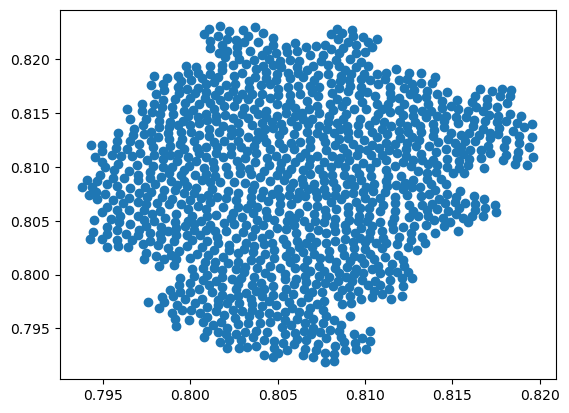

In [129]:
explore_poisson_points(radius=0.0005, seed=5, n=1200)

In [130]:
poisson_points_gdf = get_poisson_points(radius=0.0005, seed=5, n=1200, orig_points=points_gdf)

points_gdf_buf_small = points_gdf.to_crs("EPSG:3387")
points_gdf_buf_small["coords"] = points_gdf_buf_small["coords"].buffer(100)

poisson_points_gdf = gpd.overlay(poisson_points_gdf, points_gdf_buf_small, how="difference")

C:\Users\pyryp\AppData\Local\Temp\ipykernel_7964\23658067.py:32: FutureWarning:

You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.



In [131]:
# poisson_points_gdf = gpd.sjoin(poisson_points_gdf.to_crs("EPSG:4326"), polygon_gdf[["group", "geometry"]]).rename(columns={"geometry":"coords"})
poisson_points_gdf = gpd.sjoin_nearest(poisson_points_gdf.to_crs("EPSG:4326"), polygon_gdf[["group", "geometry"]]).rename(columns={"geometry":"coords"})
poisson_points_gdf["Departure station id"] = -1
poisson_points_gdf = poisson_points_gdf[["Departure station id", "group", "coords"]]
poisson_points_gdf = poisson_points_gdf.set_geometry("coords")

poisson_points_gdf = poisson_points_gdf.replace({1.0:0.0,0.0:1.0})
all_points_gdf = pd.concat([points_gdf.to_crs("EPSG:4326"), poisson_points_gdf])
all_points_gdf

c:\Users\pyryp\anaconda3\envs\ox\Lib\site-packages\geopandas\array.py:403: UserWarning:

Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




,Departure station id,group,coords
0,1,1.0,POINT (24.95021 60.15537)
1,2,1.0,POINT (24.95651 60.16099)
2,3,0.0,POINT (24.94502 60.15818)
3,4,0.0,POINT (24.94178 60.16099)
4,5,0.0,POINT (24.93629 60.15795)
...,...,...,...
1146,-1,0.0,POINT (24.95822 60.26149)
1147,-1,0.0,POINT (24.73988 60.18717)
1148,-1,0.0,POINT (24.72623 60.18702)
1149,-1,0.0,POINT (24.72345 60.18417)


In [132]:
polygon_gdf = get_voronoi_polygons(all_points_gdf, all_points_gdf)

#### Segmented map (smoother)

In [209]:
from branca.colormap import LinearColormap

colors = [(16, 1, 102), (220,191,1)] # blue to yellow

custom_cmap = LinearColormap(colors, vmin=0.0, vmax=1.0)

In [210]:
polygon_gdf.replace({1.0:0.0,0.0:1.0}).explore(column="group", tiles="Cartodb positron", style_kwds={"fillOpacity":0.15, "opacity":0.15}, cmap=custom_cmap)

### Pienalueet

In [81]:
from owslib.wfs import WebFeatureService

# URL of the WFS service
wfs_url = "https://kartat.espoo.fi/teklaogcweb/wfs.ashx"

# Connect to the WFS service
wfs = WebFeatureService(url=wfs_url, version="1.1.0")

typename = "kanta:TilastollinenAlue"

response = wfs.getfeature(typename=typename, outputFormat="GML3", srsname="EPSG:4326")

gml_file = "../data/raw/tilastollinenalue_espoo.gml"
with open(gml_file, "wb") as f:
    f.write(response.read())

In [189]:
espoo_pienalueet = gpd.read_file(gml_file, engine="fiona")
espoo_pienalueet = espoo_pienalueet[espoo_pienalueet["tyyppi"]=="pienalue"][["tunnus","geometry"]].rename(columns={"tunnus":"id_espoo"})

In [190]:
helsinki_pienalueet = gpd.read_file("../data/raw/pienalueet_WFS.gpkg")[["geometry"]]

Pienalueet yhteensä

In [191]:
def weighted_avg(group):
    return (group["group"] * group["volume"]).sum() / group["volume"].sum()

In [192]:
pienalueet_gdf = pd.concat([espoo_pienalueet, helsinki_pienalueet.to_crs("EPSG:4326")]).reset_index(drop=True)
pienalueet_gdf["area_id"] = pienalueet_gdf.index

In [193]:
areas_to_drop = [176,
340,
388,
339,
211,
387,
177,
166,
362,
286,
148,
230
]

pienalueet_gdf = pienalueet_gdf[~pienalueet_gdf["area_id"].isin(areas_to_drop)]

In [194]:
df = gpd.sjoin(points_gdf.to_crs("EPSG:3387"), pienalueet_gdf.to_crs("EPSG:3387"), how="left")
# area_group_dict = df.groupby("area_id")["group"].agg(lambda x: pd.Series.mode(x).iloc[0] if not x.empty else None).to_dict()

net_flow_df_grouped = net_flow_df.groupby("Departure station id")["volume"].sum().reset_index()

df2 = pd.merge(df, net_flow_df_grouped, how="left")
area_group_dict = df2.groupby("area_id")[["group","volume"]].apply(weighted_avg).round().to_dict()

In [195]:
pienalueet_gdf["group"] = pienalueet_gdf["area_id"].map(area_group_dict)

In [196]:
pienalueet_gdf["drop"] = np.where((~pienalueet_gdf["group"].notna()) & (pienalueet_gdf["id_espoo"].notna()) & ~(pienalueet_gdf["id_espoo"]==311), 1, 0)
pienalueet_gdf = pienalueet_gdf[pienalueet_gdf["drop"] == 0]

Fill in nans

In [197]:
nans = pienalueet_gdf[~pienalueet_gdf["group"].notna()]
df = gpd.sjoin_nearest(points_gdf.to_crs("EPSG:3387"), nans.to_crs("EPSG:3387")[["geometry", "area_id"]], how="right")[["area_id", "group"]]
area_group_nans_dict = df.groupby("area_id")["group"].agg(lambda x: pd.Series.mode(x).iloc[0] if not x.empty else None).to_dict()

In [198]:
nans["group"] = nans["area_id"].map(area_group_nans_dict)
pienalueet_gdf = pd.concat([pienalueet_gdf.dropna(subset="group"), nans])

In [199]:
pienalueet_gdf = gpd.overlay(pienalueet_gdf, meri, how="difference")

In [200]:
pienalueet_gdf = pienalueet_gdf.dissolve("group", aggfunc="first").reset_index()

In [206]:
# pienalueet_gdf = pienalueet_gdf.replace({1.0:0.0, 0.0:1.0})

#### Pienalue map

In [202]:
from branca.colormap import LinearColormap

colors = [(16, 1, 102), (220,191,1)] # blue to yellow

custom_cmap = LinearColormap(colors, vmin=0.0, vmax=1.0)

In [203]:
pienalueet_gdf = pienalueet_gdf.to_crs("EPSG:3387")
pienalueet_gdf["geometry"] = pienalueet_gdf["geometry"].buffer(1)

In [204]:
lon_center = stations_df["x"].mean()
lat_center = stations_df["y"].mean()

In [207]:
m = folium.Map(location=[lat_center+0.015, lon_center-0.05], zoom_start=12, tiles="CartoDB positron")
pienalueet_gdf.explore(m=m, column="group", style_kwds={"fillOpacity":0.17, "opacity":0.2}, cmap=custom_cmap)
m

In [208]:
# save_folium_map(m=m, save_path="../presentation/segmentation.png")

#### With points

In [66]:
df = points_gdf.copy()
df["group"] = df["group"].replace({1:0, 0:1})

df.explore(m=m, column="group", marker_kwds={"radius":5})

- Mitkä pisteet on epävarmimmat? 
- Mitä ominaisuuksia KMeansilla on?
- Parempi visualisaatio?
- Viikonloppu ja arki erikseen?
- Postinumeroalueittain?

## Net flow graphs by group

In [140]:
net_flow_segmented = pd.merge(net_flow_df, points_gdf[["Departure station id", "group"]])
net_flow_segmented

,Departure station id,time,departures,coords,lon,lat,returns,net_flow,sign,volume,group
0,1,00:00:00,266,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,165,-6.672284,-101,431,1
1,1,01:00:00,137,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,94,-5.459104,-43,231,1
2,1,02:00:00,88,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,62,-4.754353,-26,150,1
3,1,03:00:00,57,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,41,-4.086614,-16,98,1
4,1,04:00:00,35,POINT (24.9502114714031 60.155369615074),24.950211,60.155370,29,-2.805292,-6,64,1
...,...,...,...,...,...,...,...,...,...,...,...
10737,902,19:00:00,24,POINT (24.835356 60.209017),24.835356,60.209017,9,-3.999098,-15,33,1
10738,902,20:00:00,13,POINT (24.835356 60.209017),24.835356,60.209017,13,0.014500,0,26,1
10739,902,21:00:00,10,POINT (24.835356 60.209017),24.835356,60.209017,7,-1.996389,-3,17,1
10740,902,22:00:00,11,POINT (24.835356 60.209017),24.835356,60.209017,5,-2.805292,-6,16,1


In [147]:
df = net_flow_segmented.groupby(["group", "time"])["net_flow"].mean().reset_index()
df["time"] = pd.to_datetime(df["time"])

C:\Users\pyryp\AppData\Local\Temp\ipykernel_8644\2455920251.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [193]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(1,2)

fig.add_trace(
    go.Scatter(
        x=df[df["group"]==0]["time"],
        y=df[df["group"]==0]["net_flow"],
        mode="lines",
        line=dict(shape="spline", color="#100166", width=4)
        ),
        row=1,
        col=1
        )

fig.add_trace(
    go.Scatter(
        x=df[df["group"]==1]["time"],
        y=df[df["group"]==1]["net_flow"],
        mode="lines",
        line=dict(shape="spline", color="#100166", width=4)
        ),
        row=1,
        col=2
        )

fig.add_trace(
    go.Scatter(
        x=[df["time"].min(), df["time"].max()],
        y=[0,0],
        mode="lines",
        line=dict(color="black", width=1.7),
    ),
    row=1, 
    col="all"
)

fig.update_layout(
    plot_bgcolor="#FFFAF7", 
    paper_bgcolor="#FFFAF7", 
    showlegend=False, 
    width=1600,
    height=650, 
    margin=dict(t=70),
    template="simple_white",
    # xaxis_title="time",
    yaxis_title="log2(net flow)",
    # title="Trips per hour",
    xaxis=dict(
        tickmode="auto",
        nticks=6,
        tickformat="%H:%M",
        ticklen=10
    ),
    xaxis2=dict(
    tickmode="auto",
    nticks=6,
    tickformat="%H:%M",
    ticklen=10
    ),

    yaxis=dict(showgrid=True, gridwidth=2, range=[-5.8,5.8], ticklen=10),
    yaxis2=dict(showgrid=True, gridwidth=2, range=[-5.8,5.8], ticklen=10, showticklabels=False),
    font=dict(size=20)
    )

fig.add_hline(y=0, row=1, col="all")

fig